# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

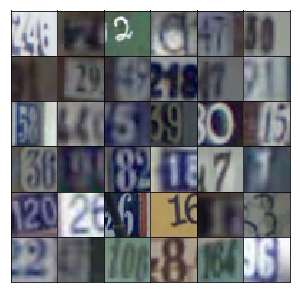

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        leaky_relu = lambda x : tf.maximum(alpha * x, x)
        batch_norm_and_act = lambda x : leaky_relu(tf.layers.batch_normalization(inputs=x, training=training))
        deconv_layer = lambda x, f, k : tf.layers.conv2d_transpose(inputs=x, 
                                                                   filters=f, 
                                                                   kernel_size=k, 
                                                                   padding="SAME", 
                                                                   strides=2)
        x = tf.layers.dense(inputs=z, units=4*4*512)
        x = tf.reshape(tensor=x, shape=(-1, 4, 4, 512))
        x = batch_norm_and_act(x)
        
        x = deconv_layer(x, 256, 4)
        x = batch_norm_and_act(x)

        x = deconv_layer(x, 128, 4)
        x = batch_norm_and_act(x)
        
        # Output layer, 32x32x3
        logits = deconv_layer(x, output_dim, 4)
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        leaky_relu = lambda x : tf.maximum(alpha * x, x)
        batch_norm_and_act = lambda x : leaky_relu(tf.layers.batch_normalization(inputs=x, training=True))
        
        x = tf.layers.conv2d(inputs=x, filters=64, kernel_size=4, padding="SAME", strides=1)
        x = leaky_relu(x)
        x = tf.layers.conv2d(inputs=x, filters=128, kernel_size=4, padding="SAME", strides=2)
        x = batch_norm_and_act(x)
        x = tf.layers.conv2d(inputs=x, filters=256, kernel_size=4, padding="SAME", strides=2)
        x = batch_norm_and_act(x)
        x = tf.layers.conv2d(inputs=x, filters=512, kernel_size=4, padding="SAME", strides=2)
        x = batch_norm_and_act(x)
        

        x = tf.reshape(tensor=x, shape=(-1, 4*4*512))
        logits = tf.layers.dense(inputs=x, units=1)
        out = tf.sigmoid(x=logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an errror without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=25, show_every=200, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [16]:
real_size = (32,32,3)
z_size = 100
learning_rate = 2e-4
batch_size = 64
epochs = 5
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/5... Discriminator Loss: 0.4549... Generator Loss: 1.3450
Epoch 1/5... Discriminator Loss: 0.3200... Generator Loss: 1.6378
Epoch 1/5... Discriminator Loss: 0.1239... Generator Loss: 2.7103
Epoch 1/5... Discriminator Loss: 0.0379... Generator Loss: 3.9880
Epoch 1/5... Discriminator Loss: 0.0374... Generator Loss: 4.3703
Epoch 1/5... Discriminator Loss: 0.0331... Generator Loss: 4.3142
Epoch 1/5... Discriminator Loss: 0.2055... Generator Loss: 9.6660
Epoch 1/5... Discriminator Loss: 0.2211... Generator Loss: 3.5886
Epoch 1/5... Discriminator Loss: 0.2643... Generator Loss: 1.9314
Epoch 1/5... Discriminator Loss: 0.1474... Generator Loss: 6.4567


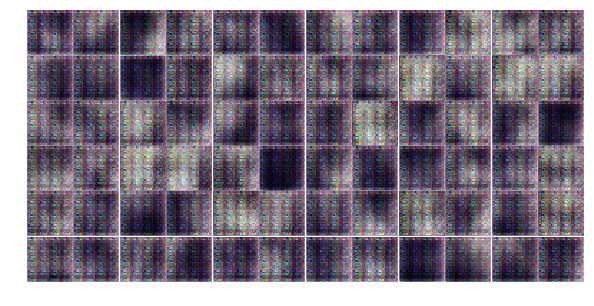

Epoch 1/5... Discriminator Loss: 0.5826... Generator Loss: 8.8653
Epoch 1/5... Discriminator Loss: 0.0986... Generator Loss: 4.1129
Epoch 1/5... Discriminator Loss: 0.2373... Generator Loss: 2.8963
Epoch 1/5... Discriminator Loss: 1.4030... Generator Loss: 15.8207
Epoch 1/5... Discriminator Loss: 0.1224... Generator Loss: 2.8062
Epoch 1/5... Discriminator Loss: 0.2964... Generator Loss: 2.3939
Epoch 1/5... Discriminator Loss: 0.1339... Generator Loss: 2.7566
Epoch 1/5... Discriminator Loss: 0.3273... Generator Loss: 6.7620
Epoch 1/5... Discriminator Loss: 0.1470... Generator Loss: 4.5050
Epoch 1/5... Discriminator Loss: 0.2461... Generator Loss: 3.1310


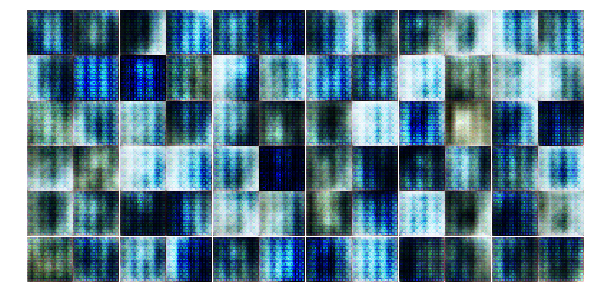

Epoch 1/5... Discriminator Loss: 0.2269... Generator Loss: 2.6174
Epoch 1/5... Discriminator Loss: 0.2226... Generator Loss: 2.6230
Epoch 1/5... Discriminator Loss: 0.1138... Generator Loss: 2.9151
Epoch 1/5... Discriminator Loss: 0.6765... Generator Loss: 1.0390
Epoch 1/5... Discriminator Loss: 1.0345... Generator Loss: 0.6370
Epoch 1/5... Discriminator Loss: 0.1759... Generator Loss: 3.6678
Epoch 1/5... Discriminator Loss: 0.2432... Generator Loss: 4.0796
Epoch 1/5... Discriminator Loss: 0.3224... Generator Loss: 2.1256
Epoch 1/5... Discriminator Loss: 1.0484... Generator Loss: 0.9881
Epoch 1/5... Discriminator Loss: 0.3990... Generator Loss: 1.6854


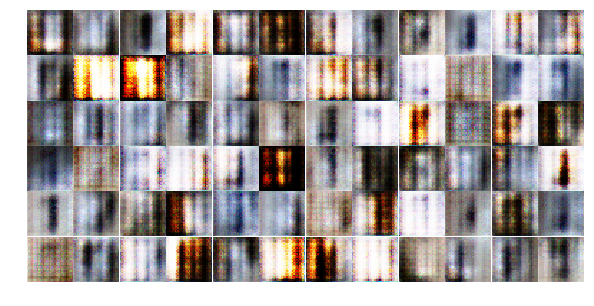

Epoch 1/5... Discriminator Loss: 1.1123... Generator Loss: 0.7498
Epoch 1/5... Discriminator Loss: 0.3776... Generator Loss: 1.7884
Epoch 1/5... Discriminator Loss: 0.2709... Generator Loss: 2.5244
Epoch 1/5... Discriminator Loss: 0.2932... Generator Loss: 2.3466
Epoch 1/5... Discriminator Loss: 0.3129... Generator Loss: 2.0359
Epoch 1/5... Discriminator Loss: 2.8852... Generator Loss: 0.1259
Epoch 1/5... Discriminator Loss: 0.3388... Generator Loss: 1.7596
Epoch 1/5... Discriminator Loss: 0.5071... Generator Loss: 1.5386
Epoch 1/5... Discriminator Loss: 0.2080... Generator Loss: 2.7204
Epoch 1/5... Discriminator Loss: 0.1373... Generator Loss: 3.9786


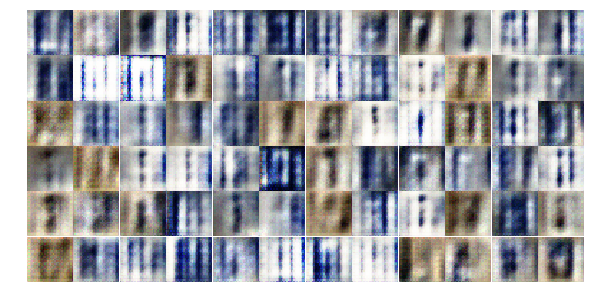

Epoch 1/5... Discriminator Loss: 0.3492... Generator Loss: 4.1509
Epoch 1/5... Discriminator Loss: 0.4635... Generator Loss: 1.6194
Epoch 1/5... Discriminator Loss: 0.5142... Generator Loss: 1.6070
Epoch 1/5... Discriminator Loss: 0.4244... Generator Loss: 1.4592
Epoch 1/5... Discriminator Loss: 0.0829... Generator Loss: 3.8292
Epoch 1/5... Discriminator Loss: 2.8311... Generator Loss: 0.1642
Epoch 1/5... Discriminator Loss: 0.2038... Generator Loss: 2.7511
Epoch 1/5... Discriminator Loss: 0.2463... Generator Loss: 2.5576
Epoch 1/5... Discriminator Loss: 0.1092... Generator Loss: 5.0112
Epoch 1/5... Discriminator Loss: 0.5532... Generator Loss: 6.1762


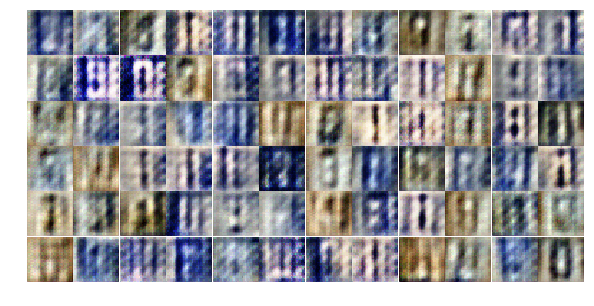

Epoch 1/5... Discriminator Loss: 0.0330... Generator Loss: 4.3743
Epoch 1/5... Discriminator Loss: 0.3288... Generator Loss: 6.1418
Epoch 1/5... Discriminator Loss: 0.2173... Generator Loss: 6.9722
Epoch 1/5... Discriminator Loss: 0.1438... Generator Loss: 4.3709
Epoch 1/5... Discriminator Loss: 0.1361... Generator Loss: 2.9425
Epoch 1/5... Discriminator Loss: 0.1498... Generator Loss: 6.1385
Epoch 1/5... Discriminator Loss: 0.3291... Generator Loss: 2.0591
Epoch 1/5... Discriminator Loss: 1.1134... Generator Loss: 0.6882
Epoch 1/5... Discriminator Loss: 0.2156... Generator Loss: 5.7136
Epoch 1/5... Discriminator Loss: 0.4507... Generator Loss: 9.5598


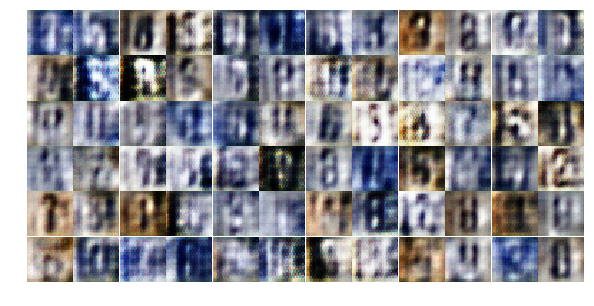

Epoch 1/5... Discriminator Loss: 0.1552... Generator Loss: 3.0702
Epoch 1/5... Discriminator Loss: 0.1580... Generator Loss: 6.7578
Epoch 1/5... Discriminator Loss: 0.1221... Generator Loss: 4.1535
Epoch 1/5... Discriminator Loss: 0.6560... Generator Loss: 4.9792
Epoch 1/5... Discriminator Loss: 0.0431... Generator Loss: 6.0930
Epoch 1/5... Discriminator Loss: 0.3468... Generator Loss: 7.6661
Epoch 1/5... Discriminator Loss: 0.0227... Generator Loss: 6.2844
Epoch 1/5... Discriminator Loss: 0.0155... Generator Loss: 5.4728
Epoch 1/5... Discriminator Loss: 1.1461... Generator Loss: 9.3068
Epoch 1/5... Discriminator Loss: 0.0231... Generator Loss: 5.6543


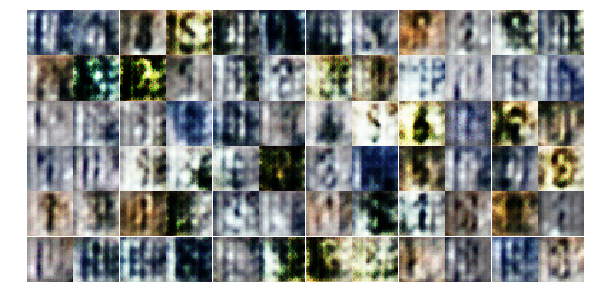

Epoch 1/5... Discriminator Loss: 0.0298... Generator Loss: 7.6232
Epoch 1/5... Discriminator Loss: 0.1238... Generator Loss: 6.6607
Epoch 1/5... Discriminator Loss: 0.1385... Generator Loss: 2.6818
Epoch 1/5... Discriminator Loss: 1.9212... Generator Loss: 0.2707
Epoch 1/5... Discriminator Loss: 0.1277... Generator Loss: 2.6802
Epoch 1/5... Discriminator Loss: 0.0614... Generator Loss: 3.7194
Epoch 1/5... Discriminator Loss: 0.0064... Generator Loss: 6.3710
Epoch 1/5... Discriminator Loss: 0.0536... Generator Loss: 5.7245
Epoch 1/5... Discriminator Loss: 0.0255... Generator Loss: 6.4996
Epoch 1/5... Discriminator Loss: 0.3238... Generator Loss: 1.8280


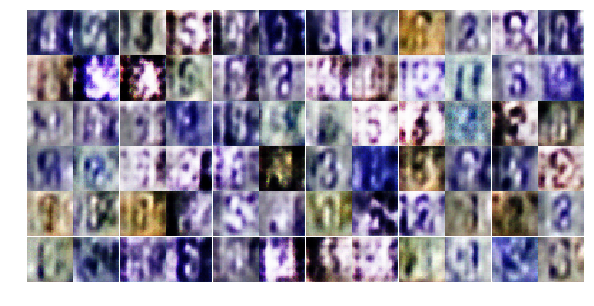

Epoch 1/5... Discriminator Loss: 0.0097... Generator Loss: 7.0139
Epoch 1/5... Discriminator Loss: 0.0299... Generator Loss: 4.5149
Epoch 1/5... Discriminator Loss: 0.0337... Generator Loss: 6.9579
Epoch 1/5... Discriminator Loss: 0.1581... Generator Loss: 3.4065
Epoch 1/5... Discriminator Loss: 0.0205... Generator Loss: 8.2037
Epoch 1/5... Discriminator Loss: 0.0222... Generator Loss: 6.3606
Epoch 1/5... Discriminator Loss: 0.0965... Generator Loss: 7.7969
Epoch 1/5... Discriminator Loss: 1.2257... Generator Loss: 0.9133
Epoch 1/5... Discriminator Loss: 0.0207... Generator Loss: 5.2006
Epoch 1/5... Discriminator Loss: 0.0374... Generator Loss: 9.2750


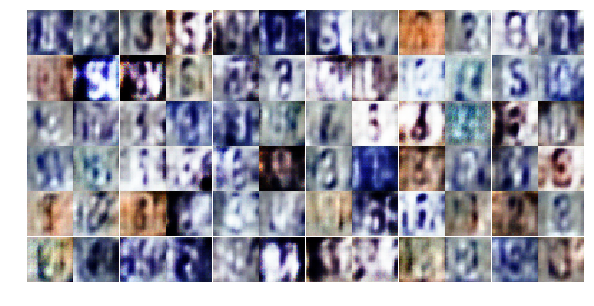

Epoch 1/5... Discriminator Loss: 0.0559... Generator Loss: 9.4471
Epoch 1/5... Discriminator Loss: 0.4250... Generator Loss: 11.5741
Epoch 1/5... Discriminator Loss: 0.7621... Generator Loss: 1.4713
Epoch 1/5... Discriminator Loss: 2.7393... Generator Loss: 0.1548
Epoch 1/5... Discriminator Loss: 0.5136... Generator Loss: 6.6036
Epoch 1/5... Discriminator Loss: 0.0554... Generator Loss: 4.6174
Epoch 1/5... Discriminator Loss: 0.0057... Generator Loss: 6.6877
Epoch 1/5... Discriminator Loss: 0.0340... Generator Loss: 7.4230
Epoch 1/5... Discriminator Loss: 1.0271... Generator Loss: 9.9374
Epoch 1/5... Discriminator Loss: 0.0307... Generator Loss: 5.6253


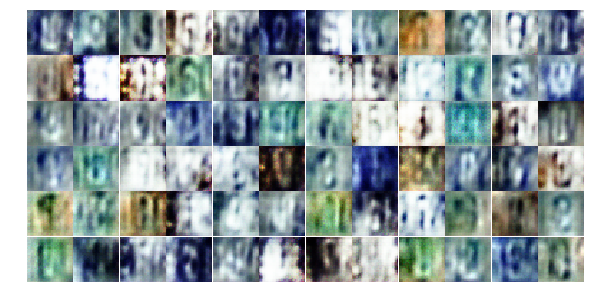

Epoch 1/5... Discriminator Loss: 0.0487... Generator Loss: 6.1258
Epoch 1/5... Discriminator Loss: 0.2145... Generator Loss: 3.5699
Epoch 1/5... Discriminator Loss: 0.0861... Generator Loss: 3.4284
Epoch 1/5... Discriminator Loss: 0.1265... Generator Loss: 8.0561
Epoch 1/5... Discriminator Loss: 0.3681... Generator Loss: 8.1586
Epoch 1/5... Discriminator Loss: 0.0595... Generator Loss: 10.4857
Epoch 1/5... Discriminator Loss: 0.2142... Generator Loss: 2.1390
Epoch 1/5... Discriminator Loss: 0.3481... Generator Loss: 1.6246
Epoch 1/5... Discriminator Loss: 0.0262... Generator Loss: 8.6606
Epoch 1/5... Discriminator Loss: 0.0086... Generator Loss: 5.2862


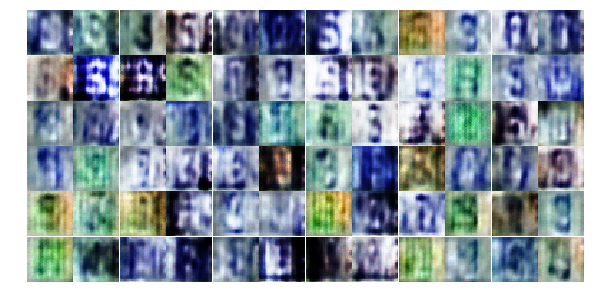

Epoch 1/5... Discriminator Loss: 0.0067... Generator Loss: 6.1352
Epoch 1/5... Discriminator Loss: 0.4958... Generator Loss: 1.5731
Epoch 1/5... Discriminator Loss: 0.0572... Generator Loss: 5.9930
Epoch 1/5... Discriminator Loss: 0.0722... Generator Loss: 10.1126
Epoch 2/5... Discriminator Loss: 0.3035... Generator Loss: 2.0133
Epoch 2/5... Discriminator Loss: 0.9179... Generator Loss: 1.3003
Epoch 2/5... Discriminator Loss: 0.0173... Generator Loss: 8.8878
Epoch 2/5... Discriminator Loss: 0.0676... Generator Loss: 3.5794
Epoch 2/5... Discriminator Loss: 0.0062... Generator Loss: 6.9982
Epoch 2/5... Discriminator Loss: 1.3931... Generator Loss: 12.2185


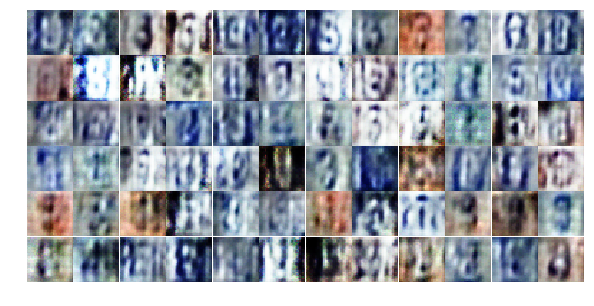

Epoch 2/5... Discriminator Loss: 0.0341... Generator Loss: 8.4887
Epoch 2/5... Discriminator Loss: 0.6301... Generator Loss: 14.2583
Epoch 2/5... Discriminator Loss: 0.9025... Generator Loss: 0.8223
Epoch 2/5... Discriminator Loss: 0.0163... Generator Loss: 9.0152
Epoch 2/5... Discriminator Loss: 0.6049... Generator Loss: 1.0761
Epoch 2/5... Discriminator Loss: 0.5538... Generator Loss: 7.2461
Epoch 2/5... Discriminator Loss: 0.0040... Generator Loss: 10.6097
Epoch 2/5... Discriminator Loss: 0.0090... Generator Loss: 12.1571
Epoch 2/5... Discriminator Loss: 0.0154... Generator Loss: 6.7494
Epoch 2/5... Discriminator Loss: 0.0232... Generator Loss: 4.8406


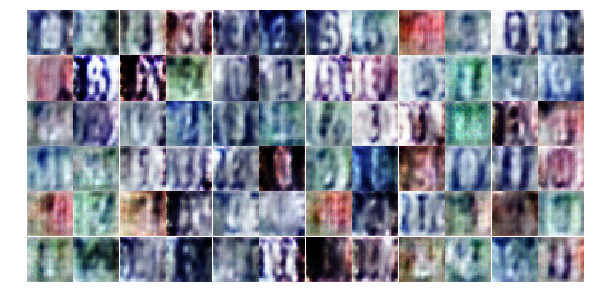

Epoch 2/5... Discriminator Loss: 0.0094... Generator Loss: 10.1445
Epoch 2/5... Discriminator Loss: 0.4588... Generator Loss: 1.9777
Epoch 2/5... Discriminator Loss: 0.0005... Generator Loss: 8.6704
Epoch 2/5... Discriminator Loss: 0.2761... Generator Loss: 2.1110
Epoch 2/5... Discriminator Loss: 0.1365... Generator Loss: 3.2921
Epoch 2/5... Discriminator Loss: 0.5789... Generator Loss: 6.6147
Epoch 2/5... Discriminator Loss: 0.2646... Generator Loss: 7.7880
Epoch 2/5... Discriminator Loss: 0.0736... Generator Loss: 3.5295
Epoch 2/5... Discriminator Loss: 0.0485... Generator Loss: 4.5822
Epoch 2/5... Discriminator Loss: 0.2039... Generator Loss: 3.0204


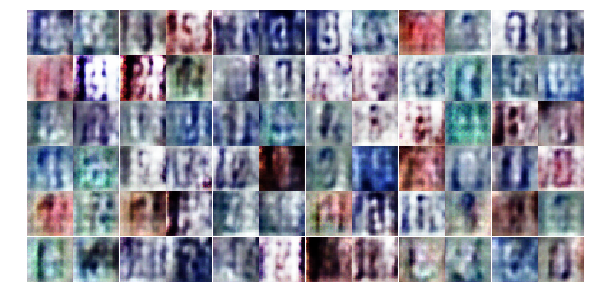

Epoch 2/5... Discriminator Loss: 0.6361... Generator Loss: 11.9924
Epoch 2/5... Discriminator Loss: 0.0293... Generator Loss: 8.8099
Epoch 2/5... Discriminator Loss: 0.0005... Generator Loss: 9.4618
Epoch 2/5... Discriminator Loss: 0.0149... Generator Loss: 4.8764
Epoch 2/5... Discriminator Loss: 0.0108... Generator Loss: 11.9809
Epoch 2/5... Discriminator Loss: 0.1618... Generator Loss: 2.5917
Epoch 2/5... Discriminator Loss: 0.0361... Generator Loss: 3.9326
Epoch 2/5... Discriminator Loss: 0.1151... Generator Loss: 3.0136
Epoch 2/5... Discriminator Loss: 0.1040... Generator Loss: 7.6055
Epoch 2/5... Discriminator Loss: 0.0123... Generator Loss: 5.7326


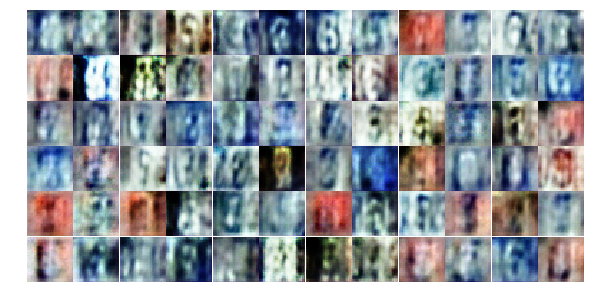

Epoch 2/5... Discriminator Loss: 0.0998... Generator Loss: 3.3041
Epoch 2/5... Discriminator Loss: 0.0019... Generator Loss: 8.5817
Epoch 2/5... Discriminator Loss: 0.1345... Generator Loss: 12.5446
Epoch 2/5... Discriminator Loss: 0.0069... Generator Loss: 11.7841
Epoch 2/5... Discriminator Loss: 0.0287... Generator Loss: 5.3652
Epoch 2/5... Discriminator Loss: 0.6115... Generator Loss: 1.1440
Epoch 2/5... Discriminator Loss: 1.4830... Generator Loss: 15.2952
Epoch 2/5... Discriminator Loss: 0.6086... Generator Loss: 10.4442
Epoch 2/5... Discriminator Loss: 1.4369... Generator Loss: 0.5384
Epoch 2/5... Discriminator Loss: 0.0458... Generator Loss: 10.9331


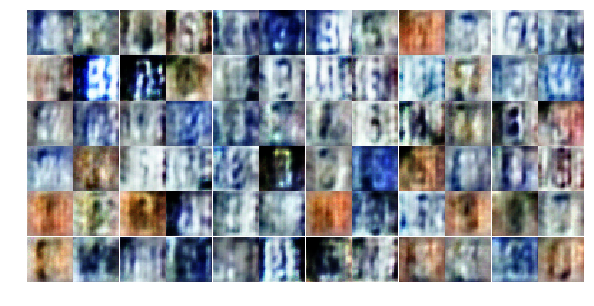

Epoch 2/5... Discriminator Loss: 1.0069... Generator Loss: 0.9908
Epoch 2/5... Discriminator Loss: 1.8968... Generator Loss: 11.0651
Epoch 2/5... Discriminator Loss: 0.0175... Generator Loss: 8.9424
Epoch 2/5... Discriminator Loss: 0.0415... Generator Loss: 4.8218
Epoch 2/5... Discriminator Loss: 0.0450... Generator Loss: 6.0499
Epoch 2/5... Discriminator Loss: 0.0244... Generator Loss: 5.1398
Epoch 2/5... Discriminator Loss: 0.5211... Generator Loss: 1.6773
Epoch 2/5... Discriminator Loss: 0.1602... Generator Loss: 2.7205
Epoch 2/5... Discriminator Loss: 0.0026... Generator Loss: 11.2350
Epoch 2/5... Discriminator Loss: 0.0025... Generator Loss: 12.1406


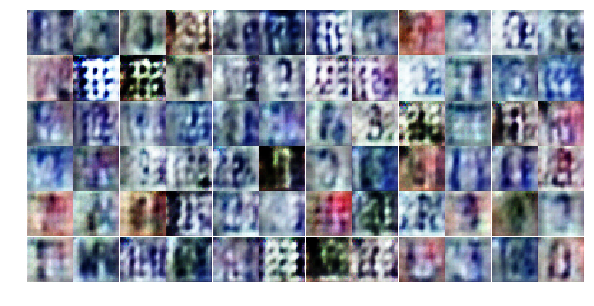

Epoch 2/5... Discriminator Loss: 0.0038... Generator Loss: 8.1278
Epoch 2/5... Discriminator Loss: 0.0400... Generator Loss: 9.9346
Epoch 2/5... Discriminator Loss: 0.0005... Generator Loss: 13.1492
Epoch 2/5... Discriminator Loss: 0.0169... Generator Loss: 5.7783
Epoch 2/5... Discriminator Loss: 0.0170... Generator Loss: 12.5214
Epoch 2/5... Discriminator Loss: 1.4741... Generator Loss: 1.1539
Epoch 2/5... Discriminator Loss: 0.0257... Generator Loss: 5.3989
Epoch 2/5... Discriminator Loss: 1.4184... Generator Loss: 0.5454
Epoch 2/5... Discriminator Loss: 0.0369... Generator Loss: 6.4113
Epoch 2/5... Discriminator Loss: 0.0100... Generator Loss: 7.1428


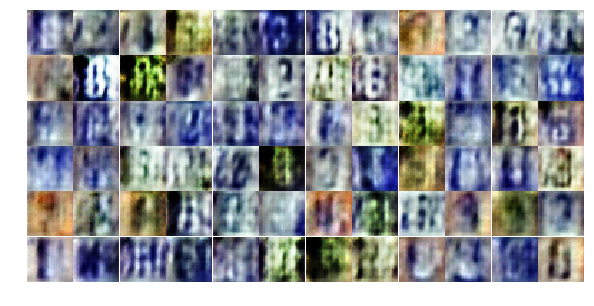

Epoch 2/5... Discriminator Loss: 0.0125... Generator Loss: 6.7663
Epoch 2/5... Discriminator Loss: 1.0213... Generator Loss: 0.8237
Epoch 2/5... Discriminator Loss: 0.0489... Generator Loss: 3.6550
Epoch 2/5... Discriminator Loss: 0.1504... Generator Loss: 7.6491
Epoch 2/5... Discriminator Loss: 0.0549... Generator Loss: 3.7701
Epoch 2/5... Discriminator Loss: 0.1585... Generator Loss: 2.6341
Epoch 2/5... Discriminator Loss: 0.0050... Generator Loss: 6.8098
Epoch 2/5... Discriminator Loss: 0.0829... Generator Loss: 3.4605
Epoch 2/5... Discriminator Loss: 0.0528... Generator Loss: 11.7126
Epoch 2/5... Discriminator Loss: 0.0158... Generator Loss: 13.5639


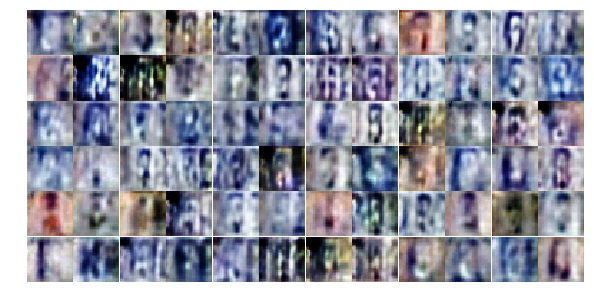

Epoch 2/5... Discriminator Loss: 0.1753... Generator Loss: 3.0253
Epoch 2/5... Discriminator Loss: 1.9634... Generator Loss: 0.4455
Epoch 2/5... Discriminator Loss: 0.0060... Generator Loss: 8.0534
Epoch 2/5... Discriminator Loss: 0.0154... Generator Loss: 9.6546
Epoch 2/5... Discriminator Loss: 0.0679... Generator Loss: 4.8289
Epoch 2/5... Discriminator Loss: 0.3026... Generator Loss: 2.3570
Epoch 2/5... Discriminator Loss: 0.0036... Generator Loss: 11.3053
Epoch 2/5... Discriminator Loss: 0.0384... Generator Loss: 4.2465
Epoch 2/5... Discriminator Loss: 0.0168... Generator Loss: 10.7750
Epoch 2/5... Discriminator Loss: 0.0493... Generator Loss: 4.1791


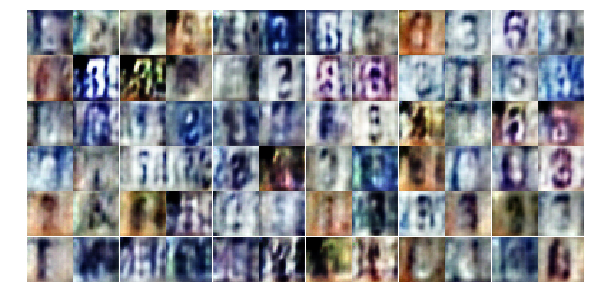

Epoch 2/5... Discriminator Loss: 0.0027... Generator Loss: 8.8582
Epoch 2/5... Discriminator Loss: 0.0607... Generator Loss: 5.2542
Epoch 2/5... Discriminator Loss: 0.0063... Generator Loss: 9.8722
Epoch 2/5... Discriminator Loss: 0.0052... Generator Loss: 7.4585
Epoch 2/5... Discriminator Loss: 0.9049... Generator Loss: 7.3499
Epoch 2/5... Discriminator Loss: 0.0349... Generator Loss: 4.7749
Epoch 2/5... Discriminator Loss: 0.5704... Generator Loss: 2.1813
Epoch 2/5... Discriminator Loss: 0.4414... Generator Loss: 3.0687
Epoch 2/5... Discriminator Loss: 0.1987... Generator Loss: 2.5364
Epoch 2/5... Discriminator Loss: 0.2248... Generator Loss: 2.7705


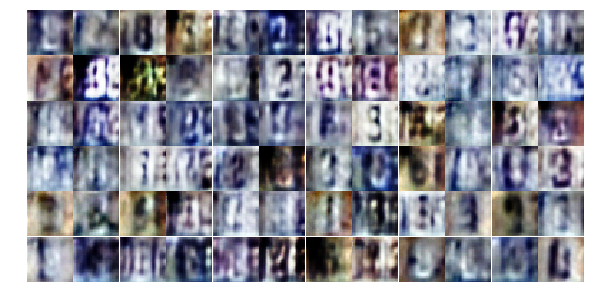

Epoch 2/5... Discriminator Loss: 0.0125... Generator Loss: 5.5892
Epoch 2/5... Discriminator Loss: 0.0782... Generator Loss: 4.2539
Epoch 2/5... Discriminator Loss: 0.0092... Generator Loss: 9.0980
Epoch 2/5... Discriminator Loss: 0.0065... Generator Loss: 7.6336
Epoch 2/5... Discriminator Loss: 0.0071... Generator Loss: 10.8706
Epoch 2/5... Discriminator Loss: 0.0121... Generator Loss: 5.2386
Epoch 2/5... Discriminator Loss: 0.4517... Generator Loss: 1.9902
Epoch 2/5... Discriminator Loss: 0.0071... Generator Loss: 13.2410
Epoch 2/5... Discriminator Loss: 0.0243... Generator Loss: 5.7499
Epoch 2/5... Discriminator Loss: 0.1976... Generator Loss: 5.2916


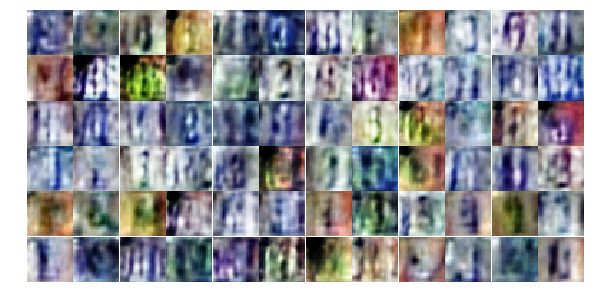

Epoch 2/5... Discriminator Loss: 0.0219... Generator Loss: 6.6331
Epoch 2/5... Discriminator Loss: 0.0246... Generator Loss: 5.1191
Epoch 2/5... Discriminator Loss: 0.0833... Generator Loss: 3.9799
Epoch 2/5... Discriminator Loss: 0.4702... Generator Loss: 3.6661
Epoch 2/5... Discriminator Loss: 0.1147... Generator Loss: 3.4133
Epoch 2/5... Discriminator Loss: 0.0452... Generator Loss: 4.8373
Epoch 2/5... Discriminator Loss: 0.4271... Generator Loss: 1.6193
Epoch 2/5... Discriminator Loss: 0.0147... Generator Loss: 12.6570
Epoch 2/5... Discriminator Loss: 0.0301... Generator Loss: 5.5838
Epoch 3/5... Discriminator Loss: 0.1211... Generator Loss: 3.9913


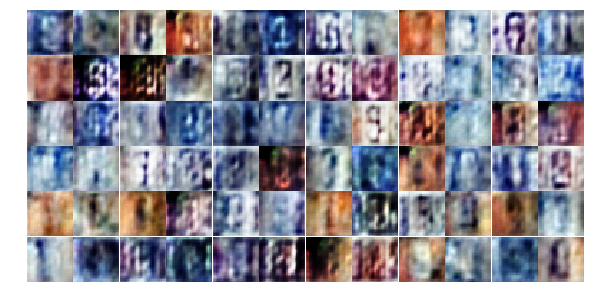

Epoch 3/5... Discriminator Loss: 0.0441... Generator Loss: 9.6540
Epoch 3/5... Discriminator Loss: 0.0300... Generator Loss: 9.3068
Epoch 3/5... Discriminator Loss: 0.0523... Generator Loss: 6.4003
Epoch 3/5... Discriminator Loss: 0.0302... Generator Loss: 6.2793
Epoch 3/5... Discriminator Loss: 0.0405... Generator Loss: 6.5442
Epoch 3/5... Discriminator Loss: 0.0025... Generator Loss: 11.2575
Epoch 3/5... Discriminator Loss: 0.0501... Generator Loss: 4.4138
Epoch 3/5... Discriminator Loss: 0.0172... Generator Loss: 5.9661
Epoch 3/5... Discriminator Loss: 0.2346... Generator Loss: 2.0931
Epoch 3/5... Discriminator Loss: 1.2106... Generator Loss: 1.5332


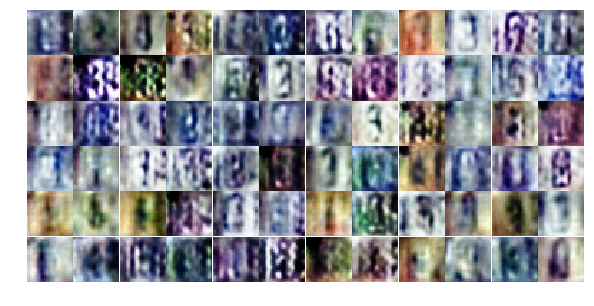

Epoch 3/5... Discriminator Loss: 0.1708... Generator Loss: 2.6143
Epoch 3/5... Discriminator Loss: 0.0286... Generator Loss: 8.0122
Epoch 3/5... Discriminator Loss: 0.0065... Generator Loss: 7.1924
Epoch 3/5... Discriminator Loss: 0.6307... Generator Loss: 1.2439
Epoch 3/5... Discriminator Loss: 0.0113... Generator Loss: 7.9694
Epoch 3/5... Discriminator Loss: 0.0296... Generator Loss: 6.1001
Epoch 3/5... Discriminator Loss: 0.2346... Generator Loss: 6.0728
Epoch 3/5... Discriminator Loss: 0.2190... Generator Loss: 2.5596
Epoch 3/5... Discriminator Loss: 0.0078... Generator Loss: 7.7642
Epoch 3/5... Discriminator Loss: 0.4892... Generator Loss: 1.5955


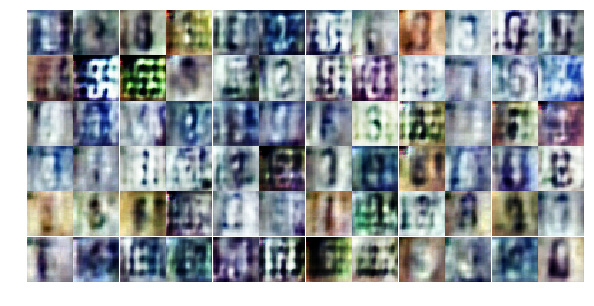

Epoch 3/5... Discriminator Loss: 0.0301... Generator Loss: 4.3931
Epoch 3/5... Discriminator Loss: 0.1003... Generator Loss: 3.2218
Epoch 3/5... Discriminator Loss: 0.0760... Generator Loss: 3.4603
Epoch 3/5... Discriminator Loss: 0.0275... Generator Loss: 5.9164
Epoch 3/5... Discriminator Loss: 0.0116... Generator Loss: 5.6485
Epoch 3/5... Discriminator Loss: 0.0178... Generator Loss: 8.7317
Epoch 3/5... Discriminator Loss: 0.0206... Generator Loss: 5.1363
Epoch 3/5... Discriminator Loss: 0.0100... Generator Loss: 9.0104
Epoch 3/5... Discriminator Loss: 0.0040... Generator Loss: 8.6360
Epoch 3/5... Discriminator Loss: 0.0930... Generator Loss: 13.0430


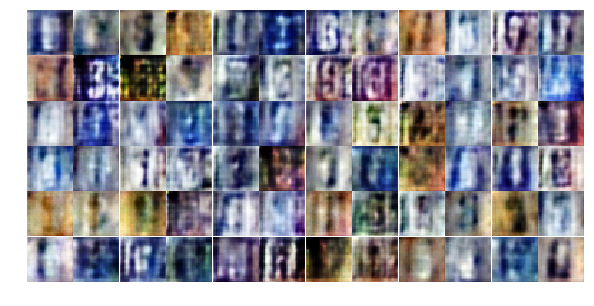

Epoch 3/5... Discriminator Loss: 0.0379... Generator Loss: 5.5274
Epoch 3/5... Discriminator Loss: 0.0035... Generator Loss: 7.2040
Epoch 3/5... Discriminator Loss: 0.0353... Generator Loss: 4.4052
Epoch 3/5... Discriminator Loss: 0.2306... Generator Loss: 2.7299
Epoch 3/5... Discriminator Loss: 0.0053... Generator Loss: 13.8714
Epoch 3/5... Discriminator Loss: 0.0034... Generator Loss: 9.2357
Epoch 3/5... Discriminator Loss: 0.0523... Generator Loss: 7.8040
Epoch 3/5... Discriminator Loss: 0.0263... Generator Loss: 9.9592
Epoch 3/5... Discriminator Loss: 0.0226... Generator Loss: 6.0425
Epoch 3/5... Discriminator Loss: 0.0351... Generator Loss: 7.2587


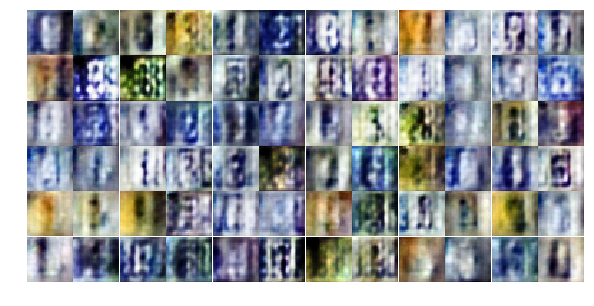

Epoch 3/5... Discriminator Loss: 0.0173... Generator Loss: 5.0091
Epoch 3/5... Discriminator Loss: 0.0458... Generator Loss: 5.1530
Epoch 3/5... Discriminator Loss: 0.0034... Generator Loss: 7.8378
Epoch 3/5... Discriminator Loss: 0.0333... Generator Loss: 4.0540
Epoch 3/5... Discriminator Loss: 1.5728... Generator Loss: 0.7322
Epoch 3/5... Discriminator Loss: 0.0602... Generator Loss: 4.1518
Epoch 3/5... Discriminator Loss: 0.0210... Generator Loss: 6.2577
Epoch 3/5... Discriminator Loss: 0.2394... Generator Loss: 3.2768
Epoch 3/5... Discriminator Loss: 0.2459... Generator Loss: 8.3977
Epoch 3/5... Discriminator Loss: 0.0400... Generator Loss: 8.8984


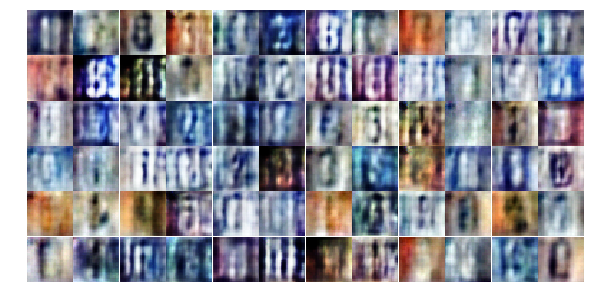

Epoch 3/5... Discriminator Loss: 0.0018... Generator Loss: 8.1930
Epoch 3/5... Discriminator Loss: 1.3263... Generator Loss: 0.6148
Epoch 3/5... Discriminator Loss: 0.0059... Generator Loss: 7.9334
Epoch 3/5... Discriminator Loss: 0.5821... Generator Loss: 1.5209
Epoch 3/5... Discriminator Loss: 0.0063... Generator Loss: 11.8925
Epoch 3/5... Discriminator Loss: 0.0098... Generator Loss: 7.1323
Epoch 3/5... Discriminator Loss: 0.0173... Generator Loss: 10.2177
Epoch 3/5... Discriminator Loss: 0.0338... Generator Loss: 4.4295
Epoch 3/5... Discriminator Loss: 0.0276... Generator Loss: 13.0967
Epoch 3/5... Discriminator Loss: 0.0520... Generator Loss: 7.2265


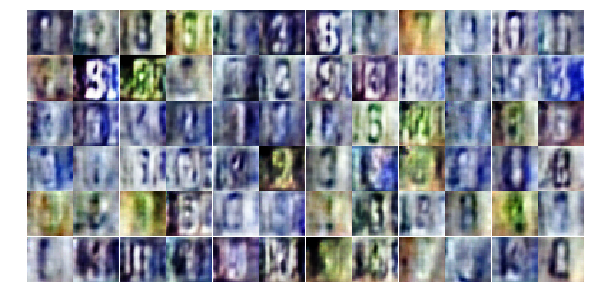

Epoch 3/5... Discriminator Loss: 0.0142... Generator Loss: 5.5017
Epoch 3/5... Discriminator Loss: 0.0258... Generator Loss: 6.9624
Epoch 3/5... Discriminator Loss: 0.0536... Generator Loss: 4.2714
Epoch 3/5... Discriminator Loss: 0.0161... Generator Loss: 9.2066
Epoch 3/5... Discriminator Loss: 0.7400... Generator Loss: 1.9890
Epoch 3/5... Discriminator Loss: 0.2224... Generator Loss: 3.0247
Epoch 3/5... Discriminator Loss: 0.2594... Generator Loss: 6.4952
Epoch 3/5... Discriminator Loss: 0.0259... Generator Loss: 7.8189
Epoch 3/5... Discriminator Loss: 0.0278... Generator Loss: 5.0536
Epoch 3/5... Discriminator Loss: 0.0245... Generator Loss: 8.8734


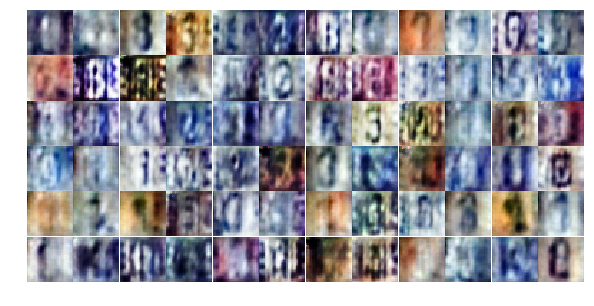

Epoch 3/5... Discriminator Loss: 0.0407... Generator Loss: 6.4648
Epoch 3/5... Discriminator Loss: 0.0191... Generator Loss: 8.6470
Epoch 3/5... Discriminator Loss: 0.3564... Generator Loss: 1.8600
Epoch 3/5... Discriminator Loss: 0.0472... Generator Loss: 4.9685
Epoch 3/5... Discriminator Loss: 0.0059... Generator Loss: 10.2164
Epoch 3/5... Discriminator Loss: 0.0287... Generator Loss: 5.2415
Epoch 3/5... Discriminator Loss: 0.2390... Generator Loss: 9.2834
Epoch 3/5... Discriminator Loss: 0.0173... Generator Loss: 13.9932
Epoch 3/5... Discriminator Loss: 0.0111... Generator Loss: 7.8885
Epoch 3/5... Discriminator Loss: 0.7026... Generator Loss: 2.5411


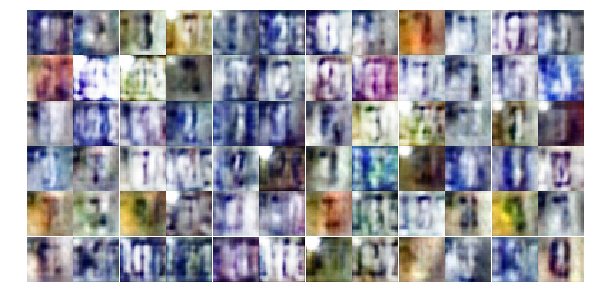

Epoch 3/5... Discriminator Loss: 0.2325... Generator Loss: 3.1177
Epoch 3/5... Discriminator Loss: 0.0880... Generator Loss: 4.8924
Epoch 3/5... Discriminator Loss: 0.0917... Generator Loss: 3.8804
Epoch 3/5... Discriminator Loss: 0.0497... Generator Loss: 4.6387
Epoch 3/5... Discriminator Loss: 0.3810... Generator Loss: 1.7171
Epoch 3/5... Discriminator Loss: 0.1977... Generator Loss: 2.5447
Epoch 3/5... Discriminator Loss: 0.0492... Generator Loss: 6.5560
Epoch 3/5... Discriminator Loss: 0.0607... Generator Loss: 7.1568
Epoch 3/5... Discriminator Loss: 1.9360... Generator Loss: 6.1076
Epoch 3/5... Discriminator Loss: 0.1832... Generator Loss: 3.6398


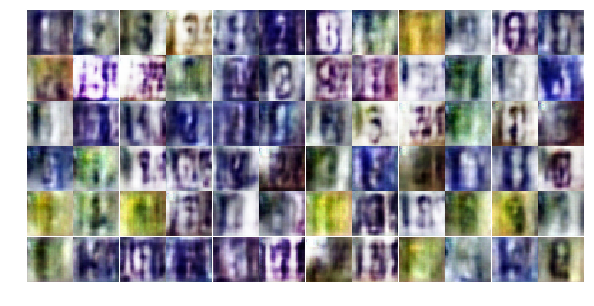

Epoch 3/5... Discriminator Loss: 0.6644... Generator Loss: 2.9746
Epoch 3/5... Discriminator Loss: 0.1767... Generator Loss: 2.4979
Epoch 3/5... Discriminator Loss: 0.3314... Generator Loss: 4.1951
Epoch 3/5... Discriminator Loss: 0.0455... Generator Loss: 8.3737
Epoch 3/5... Discriminator Loss: 0.0963... Generator Loss: 3.8654
Epoch 3/5... Discriminator Loss: 0.0021... Generator Loss: 10.1639
Epoch 3/5... Discriminator Loss: 0.0228... Generator Loss: 5.2076
Epoch 3/5... Discriminator Loss: 0.0160... Generator Loss: 5.8037
Epoch 3/5... Discriminator Loss: 0.1342... Generator Loss: 6.3636
Epoch 3/5... Discriminator Loss: 0.0662... Generator Loss: 9.6579


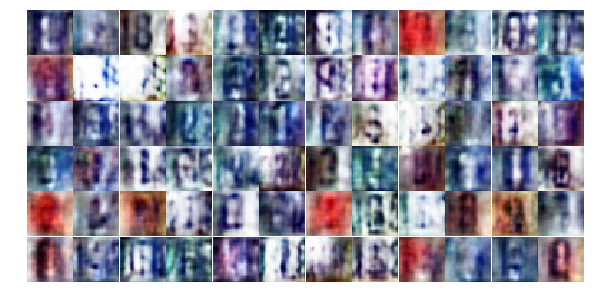

Epoch 3/5... Discriminator Loss: 3.0057... Generator Loss: 15.7388
Epoch 3/5... Discriminator Loss: 0.2873... Generator Loss: 2.6727
Epoch 3/5... Discriminator Loss: 0.1847... Generator Loss: 2.8268
Epoch 3/5... Discriminator Loss: 0.0395... Generator Loss: 5.0587
Epoch 3/5... Discriminator Loss: 0.1841... Generator Loss: 2.3158
Epoch 3/5... Discriminator Loss: 0.7018... Generator Loss: 0.9971
Epoch 3/5... Discriminator Loss: 0.0570... Generator Loss: 4.6155
Epoch 3/5... Discriminator Loss: 0.0089... Generator Loss: 8.0111
Epoch 3/5... Discriminator Loss: 0.5503... Generator Loss: 1.8451
Epoch 3/5... Discriminator Loss: 0.2136... Generator Loss: 3.4417


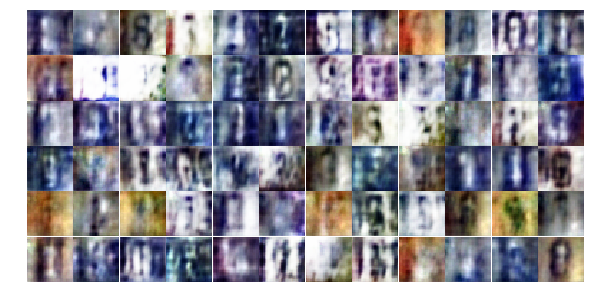

Epoch 3/5... Discriminator Loss: 0.0451... Generator Loss: 6.6398
Epoch 3/5... Discriminator Loss: 1.8409... Generator Loss: 0.2955
Epoch 3/5... Discriminator Loss: 0.0651... Generator Loss: 4.3052
Epoch 4/5... Discriminator Loss: 0.2934... Generator Loss: 6.9173
Epoch 4/5... Discriminator Loss: 0.0782... Generator Loss: 4.7245
Epoch 4/5... Discriminator Loss: 0.0831... Generator Loss: 3.6531
Epoch 4/5... Discriminator Loss: 0.1395... Generator Loss: 9.1121
Epoch 4/5... Discriminator Loss: 0.0271... Generator Loss: 7.0246
Epoch 4/5... Discriminator Loss: 0.8150... Generator Loss: 1.0563
Epoch 4/5... Discriminator Loss: 0.1566... Generator Loss: 2.7349


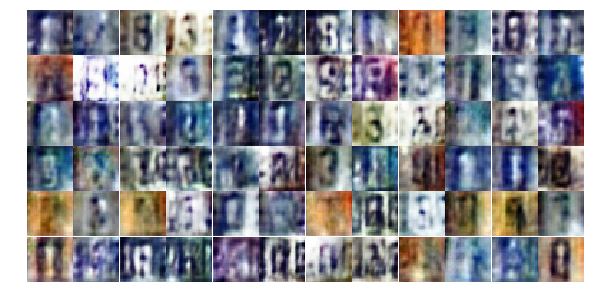

Epoch 4/5... Discriminator Loss: 0.0473... Generator Loss: 3.9151
Epoch 4/5... Discriminator Loss: 1.8655... Generator Loss: 0.4049
Epoch 4/5... Discriminator Loss: 0.0988... Generator Loss: 3.4241
Epoch 4/5... Discriminator Loss: 0.0554... Generator Loss: 4.4384
Epoch 4/5... Discriminator Loss: 0.7127... Generator Loss: 1.4552
Epoch 4/5... Discriminator Loss: 0.0066... Generator Loss: 7.7335
Epoch 4/5... Discriminator Loss: 0.0013... Generator Loss: 9.1031
Epoch 4/5... Discriminator Loss: 0.0165... Generator Loss: 9.6623
Epoch 4/5... Discriminator Loss: 3.1507... Generator Loss: 0.2419
Epoch 4/5... Discriminator Loss: 0.7098... Generator Loss: 1.0177


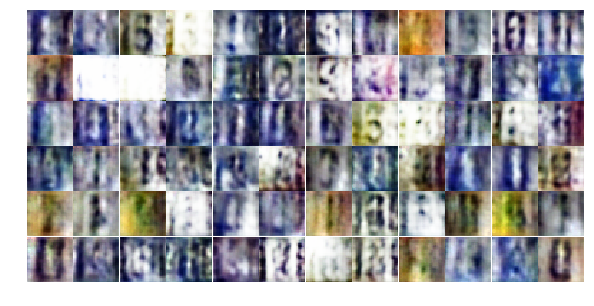

Epoch 4/5... Discriminator Loss: 0.0201... Generator Loss: 11.0259
Epoch 4/5... Discriminator Loss: 0.0466... Generator Loss: 4.5956
Epoch 4/5... Discriminator Loss: 0.1724... Generator Loss: 2.6774
Epoch 4/5... Discriminator Loss: 0.0894... Generator Loss: 5.7828
Epoch 4/5... Discriminator Loss: 0.0471... Generator Loss: 6.1831
Epoch 4/5... Discriminator Loss: 0.3422... Generator Loss: 1.6025
Epoch 4/5... Discriminator Loss: 0.0756... Generator Loss: 4.0921
Epoch 4/5... Discriminator Loss: 0.0595... Generator Loss: 10.1122
Epoch 4/5... Discriminator Loss: 0.0387... Generator Loss: 5.2821
Epoch 4/5... Discriminator Loss: 0.0575... Generator Loss: 4.8855


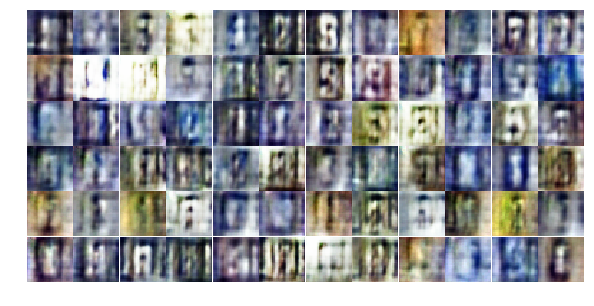

Epoch 4/5... Discriminator Loss: 0.0180... Generator Loss: 11.7050
Epoch 4/5... Discriminator Loss: 0.0708... Generator Loss: 3.4812
Epoch 4/5... Discriminator Loss: 0.0139... Generator Loss: 9.1584
Epoch 4/5... Discriminator Loss: 0.2842... Generator Loss: 2.2485
Epoch 4/5... Discriminator Loss: 0.0100... Generator Loss: 7.8013
Epoch 4/5... Discriminator Loss: 0.0010... Generator Loss: 8.9304
Epoch 4/5... Discriminator Loss: 0.0286... Generator Loss: 6.8068
Epoch 4/5... Discriminator Loss: 0.0416... Generator Loss: 4.3967
Epoch 4/5... Discriminator Loss: 0.3000... Generator Loss: 2.3403
Epoch 4/5... Discriminator Loss: 0.0255... Generator Loss: 7.9437


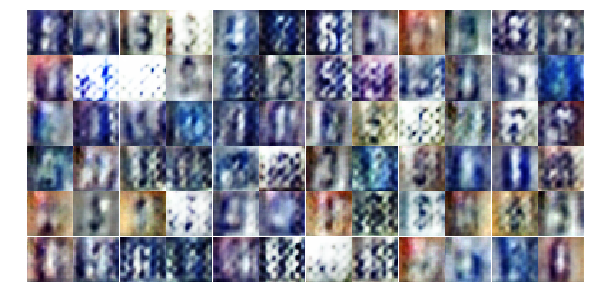

Epoch 4/5... Discriminator Loss: 0.0774... Generator Loss: 11.9312
Epoch 4/5... Discriminator Loss: 0.0274... Generator Loss: 4.8521
Epoch 4/5... Discriminator Loss: 0.0122... Generator Loss: 11.8525
Epoch 4/5... Discriminator Loss: 0.0050... Generator Loss: 9.3484
Epoch 4/5... Discriminator Loss: 0.1215... Generator Loss: 3.5160
Epoch 4/5... Discriminator Loss: 0.0007... Generator Loss: 8.4130
Epoch 4/5... Discriminator Loss: 0.0473... Generator Loss: 8.0868
Epoch 4/5... Discriminator Loss: 0.2244... Generator Loss: 11.4486
Epoch 4/5... Discriminator Loss: 0.2223... Generator Loss: 2.4515
Epoch 4/5... Discriminator Loss: 0.0110... Generator Loss: 13.9098


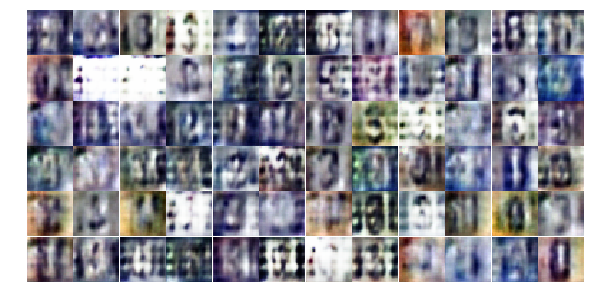

Epoch 4/5... Discriminator Loss: 0.0448... Generator Loss: 7.4494
Epoch 4/5... Discriminator Loss: 0.0581... Generator Loss: 7.5723
Epoch 4/5... Discriminator Loss: 0.0060... Generator Loss: 8.0792
Epoch 4/5... Discriminator Loss: 0.1633... Generator Loss: 5.4989
Epoch 4/5... Discriminator Loss: 0.9258... Generator Loss: 2.4323
Epoch 4/5... Discriminator Loss: 0.0625... Generator Loss: 4.9641
Epoch 4/5... Discriminator Loss: 0.0068... Generator Loss: 8.5211
Epoch 4/5... Discriminator Loss: 0.0030... Generator Loss: 10.6141
Epoch 4/5... Discriminator Loss: 0.0207... Generator Loss: 7.9863
Epoch 4/5... Discriminator Loss: 2.0688... Generator Loss: 0.4463


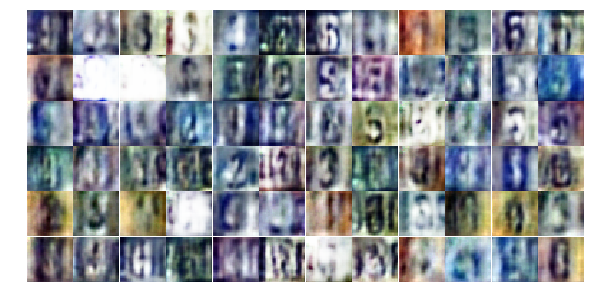

Epoch 4/5... Discriminator Loss: 0.2192... Generator Loss: 3.4782
Epoch 4/5... Discriminator Loss: 0.1613... Generator Loss: 5.5489
Epoch 4/5... Discriminator Loss: 0.4345... Generator Loss: 10.4124
Epoch 4/5... Discriminator Loss: 0.0461... Generator Loss: 5.7412
Epoch 4/5... Discriminator Loss: 0.1605... Generator Loss: 2.4397
Epoch 4/5... Discriminator Loss: 0.0404... Generator Loss: 4.3226
Epoch 4/5... Discriminator Loss: 0.0660... Generator Loss: 3.7660
Epoch 4/5... Discriminator Loss: 0.0007... Generator Loss: 9.4859
Epoch 4/5... Discriminator Loss: 0.0110... Generator Loss: 6.0637
Epoch 4/5... Discriminator Loss: 0.0138... Generator Loss: 5.4820


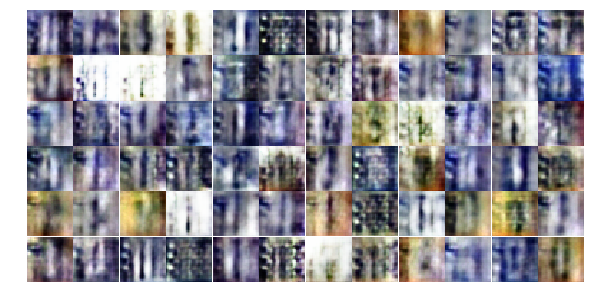

Epoch 4/5... Discriminator Loss: 0.0620... Generator Loss: 3.8308
Epoch 4/5... Discriminator Loss: 0.0014... Generator Loss: 9.3433
Epoch 4/5... Discriminator Loss: 0.0071... Generator Loss: 10.9498
Epoch 4/5... Discriminator Loss: 0.0395... Generator Loss: 4.5991
Epoch 4/5... Discriminator Loss: 0.0142... Generator Loss: 5.9223
Epoch 4/5... Discriminator Loss: 0.0092... Generator Loss: 10.1928
Epoch 4/5... Discriminator Loss: 0.0042... Generator Loss: 10.3441
Epoch 4/5... Discriminator Loss: 0.1841... Generator Loss: 2.6324
Epoch 4/5... Discriminator Loss: 0.9804... Generator Loss: 16.2967
Epoch 4/5... Discriminator Loss: 0.1180... Generator Loss: 3.7083


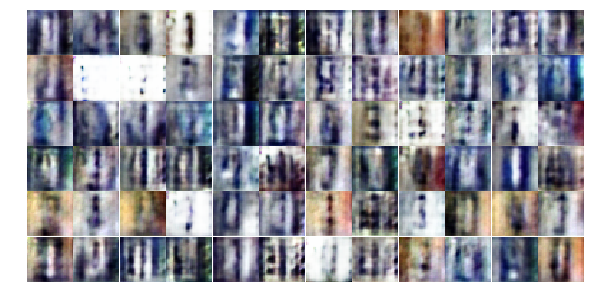

Epoch 4/5... Discriminator Loss: 0.1325... Generator Loss: 3.3552
Epoch 4/5... Discriminator Loss: 0.0182... Generator Loss: 6.4627
Epoch 4/5... Discriminator Loss: 0.0685... Generator Loss: 8.7930
Epoch 4/5... Discriminator Loss: 0.0172... Generator Loss: 7.7072
Epoch 4/5... Discriminator Loss: 0.0620... Generator Loss: 4.1653
Epoch 4/5... Discriminator Loss: 0.7224... Generator Loss: 1.4827
Epoch 4/5... Discriminator Loss: 0.1297... Generator Loss: 3.0372
Epoch 4/5... Discriminator Loss: 0.1252... Generator Loss: 4.8534
Epoch 4/5... Discriminator Loss: 0.0018... Generator Loss: 7.3989
Epoch 4/5... Discriminator Loss: 0.2870... Generator Loss: 2.0280


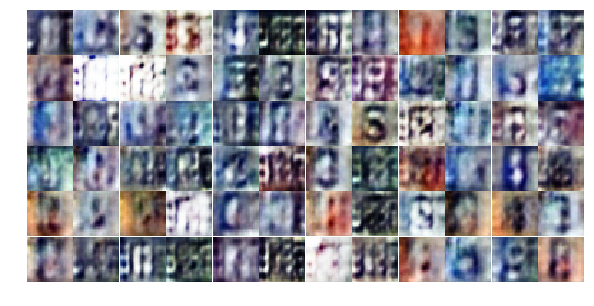

Epoch 4/5... Discriminator Loss: 1.3674... Generator Loss: 0.6394
Epoch 4/5... Discriminator Loss: 0.0740... Generator Loss: 3.3703
Epoch 4/5... Discriminator Loss: 0.0431... Generator Loss: 4.4243
Epoch 4/5... Discriminator Loss: 0.0324... Generator Loss: 4.4340
Epoch 4/5... Discriminator Loss: 0.0109... Generator Loss: 5.9292
Epoch 4/5... Discriminator Loss: 0.0600... Generator Loss: 3.2572
Epoch 4/5... Discriminator Loss: 0.1122... Generator Loss: 3.0678
Epoch 4/5... Discriminator Loss: 0.0460... Generator Loss: 4.9847
Epoch 4/5... Discriminator Loss: 0.0414... Generator Loss: 3.9495
Epoch 4/5... Discriminator Loss: 0.0307... Generator Loss: 4.6604


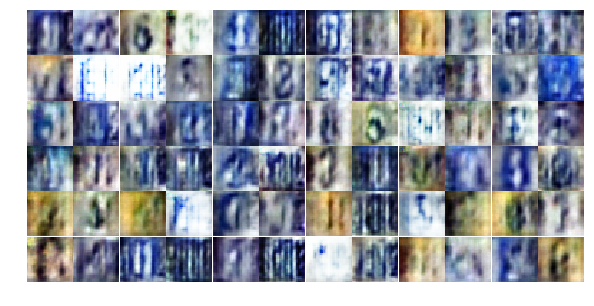

Epoch 4/5... Discriminator Loss: 0.0118... Generator Loss: 5.4192
Epoch 4/5... Discriminator Loss: 0.0029... Generator Loss: 8.4575
Epoch 4/5... Discriminator Loss: 0.0115... Generator Loss: 9.9984
Epoch 4/5... Discriminator Loss: 0.0730... Generator Loss: 8.4662
Epoch 4/5... Discriminator Loss: 0.0124... Generator Loss: 5.3878
Epoch 4/5... Discriminator Loss: 0.0608... Generator Loss: 14.4038
Epoch 4/5... Discriminator Loss: 0.0708... Generator Loss: 3.5682
Epoch 4/5... Discriminator Loss: 0.0141... Generator Loss: 5.7524
Epoch 4/5... Discriminator Loss: 0.2008... Generator Loss: 12.4851
Epoch 4/5... Discriminator Loss: 0.0156... Generator Loss: 5.5259


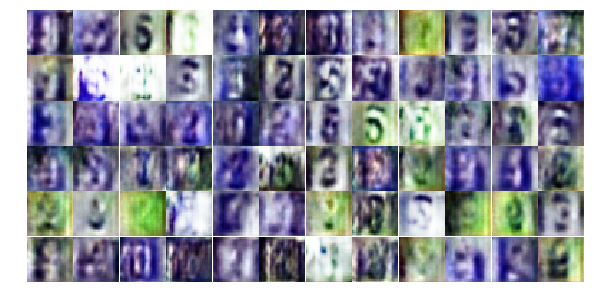

Epoch 4/5... Discriminator Loss: 0.0232... Generator Loss: 12.4277
Epoch 4/5... Discriminator Loss: 0.1590... Generator Loss: 2.9708
Epoch 4/5... Discriminator Loss: 0.0152... Generator Loss: 5.1694
Epoch 4/5... Discriminator Loss: 0.0547... Generator Loss: 3.6926
Epoch 4/5... Discriminator Loss: 0.0351... Generator Loss: 5.3818
Epoch 4/5... Discriminator Loss: 1.9642... Generator Loss: 0.3418
Epoch 4/5... Discriminator Loss: 0.0052... Generator Loss: 7.5648
Epoch 4/5... Discriminator Loss: 0.1573... Generator Loss: 3.2804
Epoch 5/5... Discriminator Loss: 0.2310... Generator Loss: 2.2600
Epoch 5/5... Discriminator Loss: 0.2393... Generator Loss: 2.1080


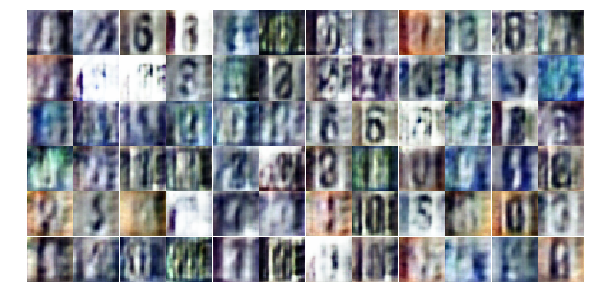

Epoch 5/5... Discriminator Loss: 0.0025... Generator Loss: 11.1740
Epoch 5/5... Discriminator Loss: 0.0235... Generator Loss: 5.6859
Epoch 5/5... Discriminator Loss: 0.0031... Generator Loss: 12.6326
Epoch 5/5... Discriminator Loss: 0.0175... Generator Loss: 5.4456
Epoch 5/5... Discriminator Loss: 0.0037... Generator Loss: 8.1709
Epoch 5/5... Discriminator Loss: 0.0060... Generator Loss: 14.2088
Epoch 5/5... Discriminator Loss: 0.0637... Generator Loss: 4.3549
Epoch 5/5... Discriminator Loss: 0.0552... Generator Loss: 3.5816
Epoch 5/5... Discriminator Loss: 0.1146... Generator Loss: 3.2098
Epoch 5/5... Discriminator Loss: 0.0071... Generator Loss: 5.9308


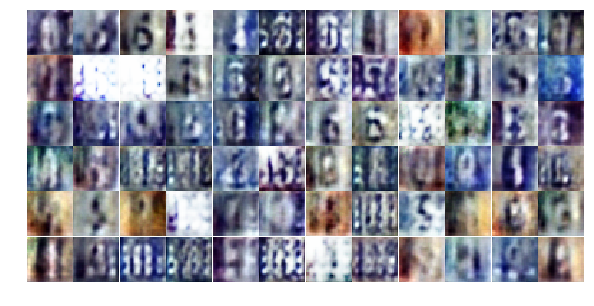

Epoch 5/5... Discriminator Loss: 0.0037... Generator Loss: 7.9494
Epoch 5/5... Discriminator Loss: 0.0136... Generator Loss: 13.4572
Epoch 5/5... Discriminator Loss: 0.0001... Generator Loss: 10.8642
Epoch 5/5... Discriminator Loss: 0.0079... Generator Loss: 7.3926
Epoch 5/5... Discriminator Loss: 0.0015... Generator Loss: 9.0288
Epoch 5/5... Discriminator Loss: 0.0019... Generator Loss: 8.7312
Epoch 5/5... Discriminator Loss: 0.0170... Generator Loss: 6.3001
Epoch 5/5... Discriminator Loss: 0.0016... Generator Loss: 8.1648
Epoch 5/5... Discriminator Loss: 0.0121... Generator Loss: 6.1740
Epoch 5/5... Discriminator Loss: 0.0020... Generator Loss: 10.7108


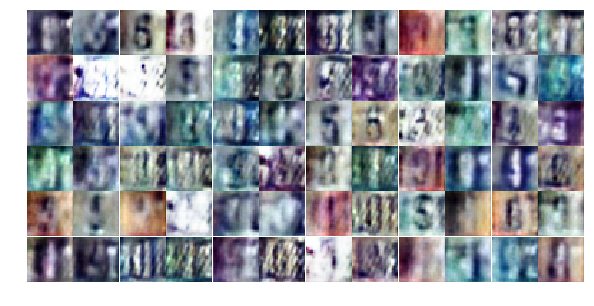

Epoch 5/5... Discriminator Loss: 0.0660... Generator Loss: 4.5337
Epoch 5/5... Discriminator Loss: 0.5488... Generator Loss: 1.8182
Epoch 5/5... Discriminator Loss: 0.2069... Generator Loss: 4.6450
Epoch 5/5... Discriminator Loss: 0.5301... Generator Loss: 6.1851
Epoch 5/5... Discriminator Loss: 0.0731... Generator Loss: 3.6555
Epoch 5/5... Discriminator Loss: 0.1026... Generator Loss: 4.0727
Epoch 5/5... Discriminator Loss: 0.2224... Generator Loss: 2.2580
Epoch 5/5... Discriminator Loss: 0.0558... Generator Loss: 7.2786
Epoch 5/5... Discriminator Loss: 0.3141... Generator Loss: 2.5419
Epoch 5/5... Discriminator Loss: 1.5052... Generator Loss: 9.1414


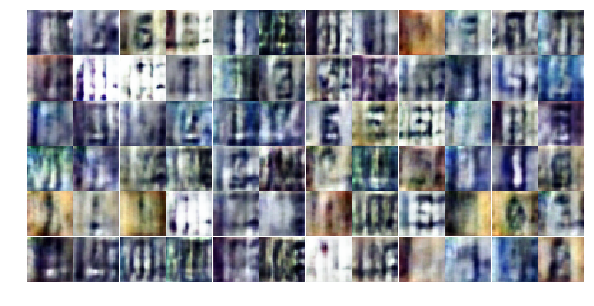

Epoch 5/5... Discriminator Loss: 0.0712... Generator Loss: 5.6242
Epoch 5/5... Discriminator Loss: 0.1288... Generator Loss: 3.5042
Epoch 5/5... Discriminator Loss: 0.0308... Generator Loss: 7.5241
Epoch 5/5... Discriminator Loss: 0.0307... Generator Loss: 8.4613
Epoch 5/5... Discriminator Loss: 1.1539... Generator Loss: 0.7652
Epoch 5/5... Discriminator Loss: 0.0891... Generator Loss: 3.2935
Epoch 5/5... Discriminator Loss: 0.0064... Generator Loss: 8.3871
Epoch 5/5... Discriminator Loss: 0.0969... Generator Loss: 3.4044
Epoch 5/5... Discriminator Loss: 0.0983... Generator Loss: 13.9134
Epoch 5/5... Discriminator Loss: 0.0240... Generator Loss: 5.8526


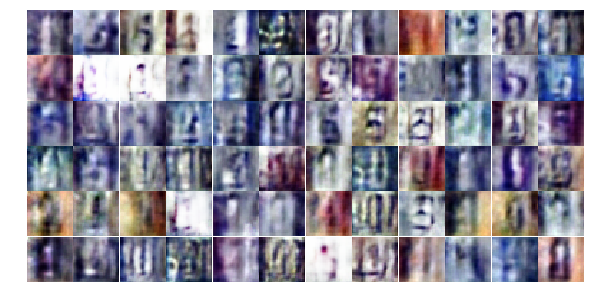

Epoch 5/5... Discriminator Loss: 0.0863... Generator Loss: 3.2698
Epoch 5/5... Discriminator Loss: 0.2843... Generator Loss: 1.8258
Epoch 5/5... Discriminator Loss: 0.0114... Generator Loss: 14.3397
Epoch 5/5... Discriminator Loss: 0.0332... Generator Loss: 9.6748
Epoch 5/5... Discriminator Loss: 0.0210... Generator Loss: 9.1387
Epoch 5/5... Discriminator Loss: 0.0240... Generator Loss: 5.4332
Epoch 5/5... Discriminator Loss: 0.9028... Generator Loss: 0.9256
Epoch 5/5... Discriminator Loss: 0.0622... Generator Loss: 6.9244
Epoch 5/5... Discriminator Loss: 0.0064... Generator Loss: 15.2839
Epoch 5/5... Discriminator Loss: 0.0802... Generator Loss: 10.7927


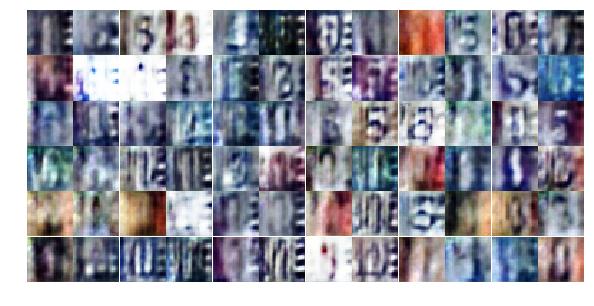

Epoch 5/5... Discriminator Loss: 0.0069... Generator Loss: 10.6774
Epoch 5/5... Discriminator Loss: 0.0308... Generator Loss: 4.3529
Epoch 5/5... Discriminator Loss: 0.8051... Generator Loss: 1.7551
Epoch 5/5... Discriminator Loss: 0.0507... Generator Loss: 3.9295
Epoch 5/5... Discriminator Loss: 0.0200... Generator Loss: 5.0225
Epoch 5/5... Discriminator Loss: 0.1662... Generator Loss: 6.8178
Epoch 5/5... Discriminator Loss: 1.7394... Generator Loss: 0.5039
Epoch 5/5... Discriminator Loss: 0.0105... Generator Loss: 10.9648
Epoch 5/5... Discriminator Loss: 0.5013... Generator Loss: 1.7609
Epoch 5/5... Discriminator Loss: 0.0512... Generator Loss: 7.8838


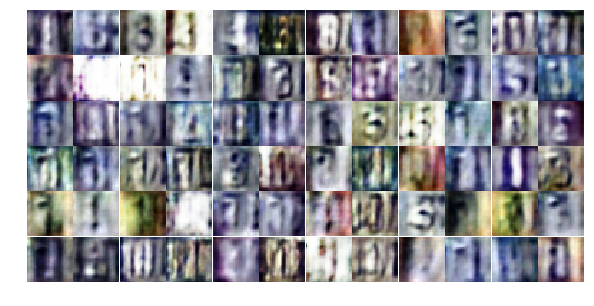

Epoch 5/5... Discriminator Loss: 0.0894... Generator Loss: 4.2605
Epoch 5/5... Discriminator Loss: 0.0904... Generator Loss: 5.9504
Epoch 5/5... Discriminator Loss: 0.0188... Generator Loss: 5.1767
Epoch 5/5... Discriminator Loss: 0.0038... Generator Loss: 8.6462
Epoch 5/5... Discriminator Loss: 0.0017... Generator Loss: 7.9247
Epoch 5/5... Discriminator Loss: 0.0022... Generator Loss: 9.8911
Epoch 5/5... Discriminator Loss: 0.0065... Generator Loss: 7.6407
Epoch 5/5... Discriminator Loss: 0.0147... Generator Loss: 6.1197
Epoch 5/5... Discriminator Loss: 0.0148... Generator Loss: 5.5813
Epoch 5/5... Discriminator Loss: 0.0499... Generator Loss: 3.9453


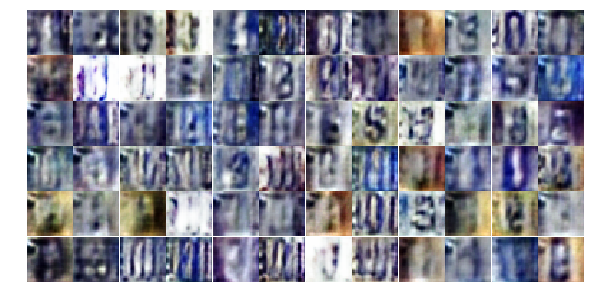

Epoch 5/5... Discriminator Loss: 0.0079... Generator Loss: 6.8691
Epoch 5/5... Discriminator Loss: 0.0295... Generator Loss: 5.0688
Epoch 5/5... Discriminator Loss: 0.0115... Generator Loss: 9.9918
Epoch 5/5... Discriminator Loss: 0.0179... Generator Loss: 9.2008
Epoch 5/5... Discriminator Loss: 0.5528... Generator Loss: 15.5800
Epoch 5/5... Discriminator Loss: 0.0845... Generator Loss: 7.4949
Epoch 5/5... Discriminator Loss: 0.0302... Generator Loss: 7.0049
Epoch 5/5... Discriminator Loss: 0.1401... Generator Loss: 2.8870
Epoch 5/5... Discriminator Loss: 0.0370... Generator Loss: 5.5282
Epoch 5/5... Discriminator Loss: 0.0017... Generator Loss: 10.9647


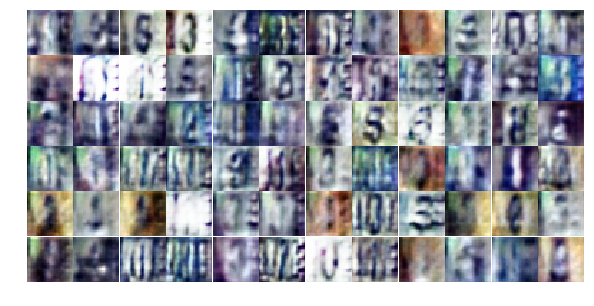

Epoch 5/5... Discriminator Loss: 0.2911... Generator Loss: 2.2385
Epoch 5/5... Discriminator Loss: 0.0046... Generator Loss: 9.6223
Epoch 5/5... Discriminator Loss: 0.0497... Generator Loss: 11.2962
Epoch 5/5... Discriminator Loss: 0.0089... Generator Loss: 8.1774
Epoch 5/5... Discriminator Loss: 0.0043... Generator Loss: 13.5188
Epoch 5/5... Discriminator Loss: 0.0161... Generator Loss: 13.1175
Epoch 5/5... Discriminator Loss: 0.0011... Generator Loss: 10.4525
Epoch 5/5... Discriminator Loss: 0.0037... Generator Loss: 7.4360
Epoch 5/5... Discriminator Loss: 0.0470... Generator Loss: 4.0983
Epoch 5/5... Discriminator Loss: 0.8674... Generator Loss: 1.0312


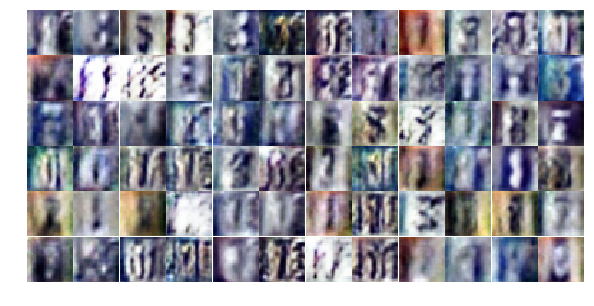

Epoch 5/5... Discriminator Loss: 0.0123... Generator Loss: 13.1421
Epoch 5/5... Discriminator Loss: 0.3143... Generator Loss: 1.8684
Epoch 5/5... Discriminator Loss: 0.1392... Generator Loss: 3.4201
Epoch 5/5... Discriminator Loss: 0.0085... Generator Loss: 6.9119
Epoch 5/5... Discriminator Loss: 0.0399... Generator Loss: 4.1353
Epoch 5/5... Discriminator Loss: 0.0041... Generator Loss: 7.0804
Epoch 5/5... Discriminator Loss: 0.0022... Generator Loss: 16.6442
Epoch 5/5... Discriminator Loss: 0.0290... Generator Loss: 5.3362
Epoch 5/5... Discriminator Loss: 0.0008... Generator Loss: 8.6702
Epoch 5/5... Discriminator Loss: 0.0256... Generator Loss: 11.9163


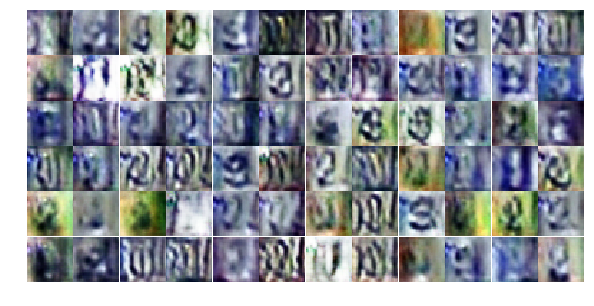

Epoch 5/5... Discriminator Loss: 0.0192... Generator Loss: 4.8297
Epoch 5/5... Discriminator Loss: 0.0004... Generator Loss: 12.3850
Epoch 5/5... Discriminator Loss: 0.0835... Generator Loss: 11.5625
Epoch 5/5... Discriminator Loss: 0.0111... Generator Loss: 8.5317
Epoch 5/5... Discriminator Loss: 0.0047... Generator Loss: 10.8483
Epoch 5/5... Discriminator Loss: 0.0144... Generator Loss: 5.4161
Epoch 5/5... Discriminator Loss: 0.0160... Generator Loss: 5.4757
Epoch 5/5... Discriminator Loss: 0.0668... Generator Loss: 5.2676
Epoch 5/5... Discriminator Loss: 0.3060... Generator Loss: 2.1102
Epoch 5/5... Discriminator Loss: 0.9044... Generator Loss: 2.6676


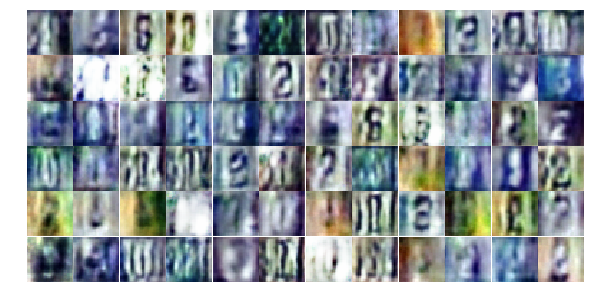

Epoch 5/5... Discriminator Loss: 0.2753... Generator Loss: 2.2984
Epoch 5/5... Discriminator Loss: 0.1375... Generator Loss: 3.3981


In [17]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

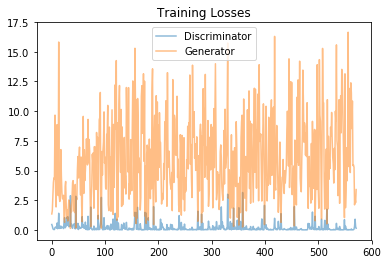

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

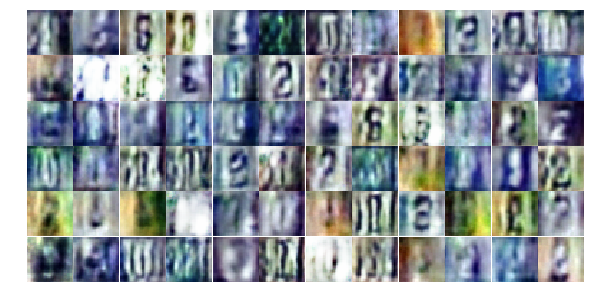

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))